---
format:
  html:
    other-links:
      - text: This notebook
        href: L24-SVD.ipynb
      - text: preamble.jl
        href: preamble.jl
---


#  Singular Value Decomposition

::: {.callout-note}

These notes are mainly a record of what we discussed and are not a substitute for attending the lectures and reading books! If anything is unclear/wrong, let me know and I will update the notes. 

::: 

In [86]:
# | include: false

include("preamble.jl");
using Images

✓ file included! 

using: Plots, LaTeXStrings, Polynomials, PrettyTables, LinearAlgebra 

functions included: 
    Ch2: simple_iteration, Newton, orderOfConvergence, 
    Ch3: ChebyshevNodes, ChebyshevInterpolant, Lagrange, 

Use @doc <<function>> for help


## Singular Value Decomposition

Recall that, if $A$ is normal (i.e. $A^TA = AA^T$) then there exist diagonal $\Lambda$ and orthogonal $P$ (i.e. $P^{-1} = P^T$) such that $A = P \Lambda P^T$ [this is an eigenvalue decompositon of $A$ (the entries of $\Lambda$ are the eigenvalues and the columns of $P$ are associated eigenvalues)]  

In [87]:
A = [1 -1; -1 1]

# A is symmetric and therefore normal
display( A'A - A*A' )

# computes the eigenvalues and eigenvectors of A
λ, P = eigen(A)

2×2 Matrix{Int64}:
 0  0
 0  0

Eigen{Float64, Float64, Matrix{Float64}, Vector{Float64}}
values:
2-element Vector{Float64}:
 0.0
 2.0
vectors:
2×2 Matrix{Float64}:
 -0.707107  -0.707107
 -0.707107   0.707107

For some matrices, this decomposition is impossible:


In [88]:
A = [42 1 ; 0 -101]
λ, P = eigen(A)

# eigenvectors
display( A*P - P*diagm(λ) )

# But P is not orthogonal 
display( P )

# in this case A is not normal!
display( A'A - A*A' ) 

2×2 Matrix{Float64}:
 0.0  0.0
 0.0  0.0

2×2 Matrix{Float64}:
 -0.00699284  1.0
  0.999976    0.0

2×2 Matrix{Int64}:
  -1  143
 143    1

Singular value decomposition of $A \in \mathbb R^{m\times n}$ is of the form $A = P \Sigma Q^T$ where $P \in \mathbb R^{m\times m}, \Sigma \in \mathbb R^{m\times n}, Q \in \mathbb R^{n\times n}$ and $P,Q$ orthogonal and $\Sigma$ diagonal. We normally write the diagonal entries of $\Sigma$ as $\sigma_1 \geq \sigma_2 \geq \cdots \geq \sigma_r \geq 0$ where $r := \min\{m,n\}$.

In [89]:
P, σ, Q = svd(A)
Σ = diagm( σ )

display( Σ )

# A can be written as a singular value decomposition
display( P * Σ * Q' )

# P orthogonal
display( P'P )

# Q orthogonal
display( Q'Q )

2×2 Matrix{Float64}:
 101.006   0.0
   0.0    41.9975

2×2 Matrix{Float64}:
 42.0             1.0
  1.11022e-16  -101.0

2×2 Matrix{Float64}:
 1.0  0.0
 0.0  1.0

2×2 Matrix{Float64}:
 1.0  0.0
 0.0  1.0

<div style='background-color: #cce0ff; padding: 10px; border-left: 5px solid #0066ff;'><strong>Example.</strong> 

Find the SVD of $A = \begin{pmatrix} 1 \\ 0 \end{pmatrix}$.

</div> 

<div class='alert alert-block alert-info'><b>Theorem.</b> 

The eigenvalues of $A^TA$ are real, $\geq 0$, and the largest $r = \min\{m,n\}$ of them are squares of the sigular values of $A$.

</div> 

<div class='alert alert-block alert-success'><b>Proof.</b> 

Notice that if $A = P \Sigma Q^T$, then 

\begin{align}
    A^T A &= ( P \Sigma Q^T )^T ( P \Sigma Q^T ) \nonumber\\
    %
    &= Q \Sigma P^T P \Sigma Q^T  \nonumber\\
    %
    &= Q \Sigma^T \Sigma Q^T
\end{align}

and so $\Sigma^T\Sigma$ contains the squares of the eigenvalues of $A^TA$.

</div> 

In [90]:
sqrt.( eigen( A'A ).values )

2-element Vector{Float64}:
  41.9975112465116
 101.00598521423932

Notice that 

\begin{align}
    A = P \Sigma Q^T 
    %
    = ... = \sum_{j=1}^r \sigma_j u_j v_j^T
\end{align}

where $u_j$ is the $j^\text{th}$ column of $P$ and $v_j$ is the $j^\text{th}$ column of $Q$. Since $(\sigma_j)$ is decreasing, later terms in the sum have less importance. This fact is used for dimension reduction (principal component analysis). That is, we make the approximation

\begin{align}
    A \approx A_k := \sum_{j=1}^k \sigma_j u_j v_j^T
\end{align}

where $k \ll r$. Since the rank of $A_k$ is $\leq k$, this is a low rank approximation to $A$.

We will now see an example in image compression. First, we load a bunch of images and choose *Monty*:

,,,,,,,,,,,,,,,,

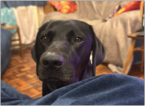
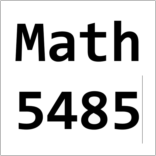
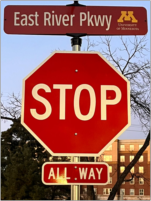
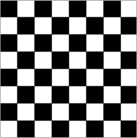
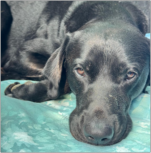
...
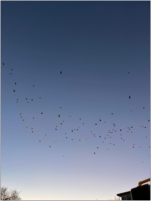
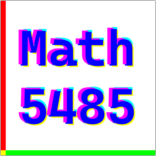
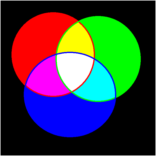
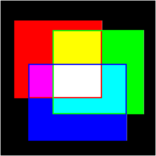
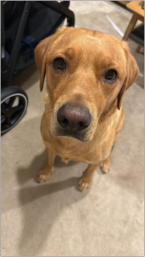

In [91]:
i = 1

img = [load("dog.jpg"), load("math5485.png"), load("stop.jpeg"), load("chessboard.png"), load("dog2.jpeg"), load("skyline.jpeg"), load("falls.jpeg"), load("stonearch.jpeg"), load("M.jpeg"), load("bike.jpeg"), load("art.jpeg"), load("rounds.jpeg"), load("birds.jpeg"),load("math5485-colour-2.png"), load("RGB.png"), load("RGB-box.png"), load("dog3.jpeg")]

839 x 1152 image = 966528 pixels 


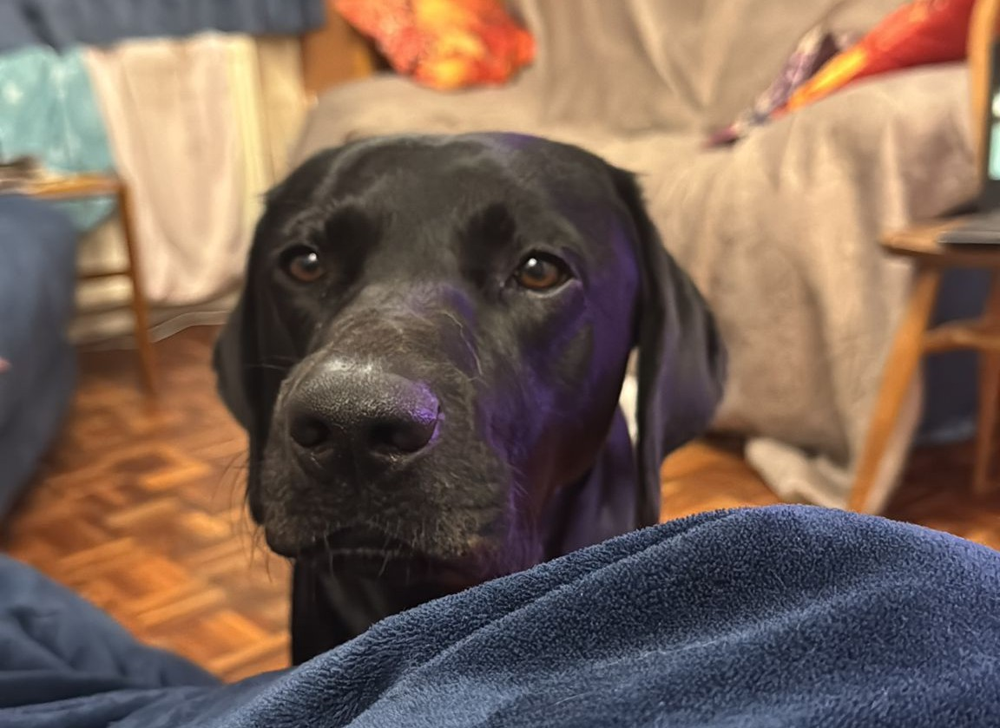

In [92]:
# | echo: false

I = img[i]

if (i == 4)   
    I = I[450:1200, 200:1000] 
elseif (i==10)
    I = I[500:1150,150:1050]
elseif (i==11)
    I = I[400:1100,200:1000]
elseif (i==18)
    I = I[200:1200,200:1100]
elseif (i==2)
    I = I[61:end-60,61:end-60]
end

m, n = size( I )
println( "$m x $n image = ", m*n, " pixels " )

I

Images are matrices where each entry is a colour: 

In [93]:
I[12,64]

You can manipulate images just like matrices: e.g.

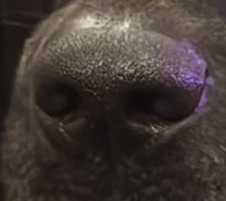

In [94]:
I'
I[:,reverse(1:end)]
I[400:600, 300:525]

Colours are made up of red, green, blue (RGB) channels and you can convert the image to grayscale too. (Grayscale turns out to the weighted average $0.299 * R + 0.587 * G + 0.114 * B$ of the RGB channels).

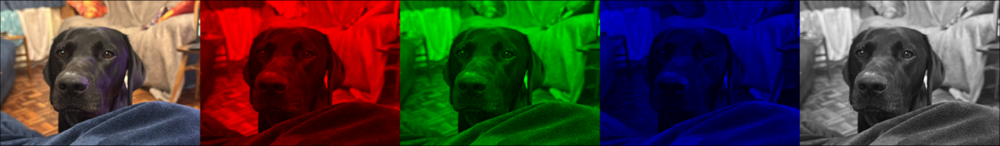

In [95]:
z = zeros(m,n);
R, G, B, A = Float64.(red.(I)), Float64.(green.(I)), Float64.(blue.(I)), Float64.(Gray.(I));

[ RGB.(R, G, B) RGB.(R, z, z) RGB.(z, G, z) RGB.(z, z, B) Gray.(I) ]

$A$ is now the grayscale image which is represented as a $m \times n$ matrix of values between $0$ and $1$: 

In [96]:
A

839×1152 Matrix{Float64}:
 0.462745  0.462745  0.462745  0.462745  …  0.560784  0.533333  0.517647
 0.462745  0.462745  0.462745  0.462745     0.560784  0.533333  0.509804
 0.466667  0.466667  0.466667  0.466667     0.552941  0.521569  0.498039
 0.470588  0.470588  0.470588  0.470588     0.545098  0.509804  0.486275
 0.47451   0.47451   0.47451   0.47451      0.541176  0.509804  0.486275
 0.482353  0.482353  0.482353  0.482353  …  0.537255  0.509804  0.486275
 0.486275  0.486275  0.486275  0.486275     0.537255  0.501961  0.478431
 0.490196  0.490196  0.490196  0.490196     0.529412  0.494118  0.466667
 0.486275  0.490196  0.490196  0.490196     0.521569  0.482353  0.454902
 0.490196  0.490196  0.494118  0.494118     0.517647  0.478431  0.45098
 ⋮                                       ⋱            ⋮         
 0.337255  0.333333  0.333333  0.329412  …  0.294118  0.247059  0.2
 0.317647  0.317647  0.313725  0.309804     0.294118  0.247059  0.203922
 0.305882  0.301961  0.298039  0.298039

We may compute the SVD of this matrix. Here, we compute the SVD and plot the singular values:

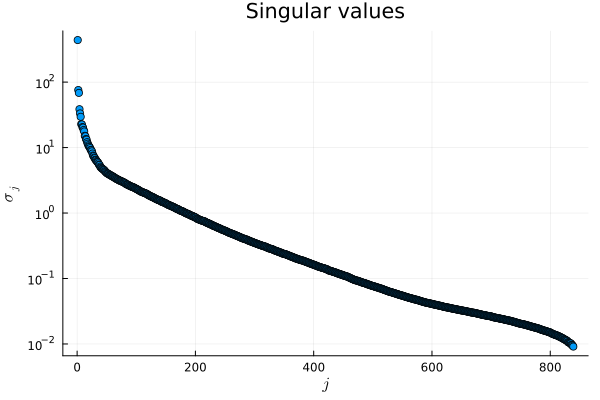

In [97]:
P, σ, Q = svd(A)
scatter(σ, xaxis=(L"j"), yaxis=:log, ylabel=L"\sigma_j", title="Singular values", legend=false)

We now approximate the image represented by the matrix $A$ by a matrix $A_k$ of much smaller rank:

\begin{align}
    A = \sum_{j=1}^r \sigma_j u_j v_j^T \approx A_k := \sum_{j=1}^k \sigma_j u_j v_j^T
\end{align}

where $k \ll r$. We will see that, if the singular values decay fast enough, then the error committed in this approximation is small, leading to image file of a much smaller size.

We do this for the (grayscale) image of Monty:

┌ Info: Saved animation to c:\Users\math5\Math 5485\Math5485\Pictures\Monty-grayscale.gif
└ @ Plots C:\Users\math5\.julia\packages\Plots\xKhUG\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\math5\\Math 5485\\Math5485\\Pictures\\Monty-grayscale.gif")
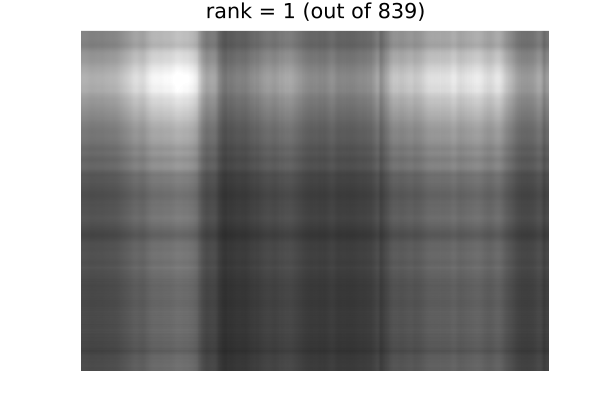

In [98]:
plt = plot( frame=:none ) 
kmax = length(σ)
anim = @animate for k ∈ [1,2,3,4,5,6,7,8,9,10,15,20,30,40,50,60,100,150,200,300]
    if (k<=kmax)
        plot( plt, Gray.( P[:,1:k] * diagm( σ[1:k] ) * Q[:,1:k]' ), title="rank = $k (out of $kmax)" ) 
    end
end
gif(anim, "Pictures/Monty-grayscale.gif", fps = 2) 

The image of Monty looks pretty good for $k = 100$. This corresponds to $\approx 20\%$ of the orginial data storage requirements:

In [99]:
r = 100;
println( "pixels = $m x $n = ", m*n ) 
println( "PCA amount of data (with k = $r) = ", r * (m+n+1) )
println( "ratio = " , (r*(m+n+1))/(m*n))

pixels = 839 x 1152 = 966528
PCA amount of data (with k = 100) = 199200
ratio = 0.206098529996027


One may define the error between two images $A$ and $B$ to be $\max_{i,j} |A_{ij} - B_{ij}|$ (so that no pixel value differs by more than the error). There are other choices of norm which may make more sense in different context (in fact, it turns out that $A_k$ is the best rank $k$ approximation to $A$ with respect to the operator norm). Here, we plot the error:

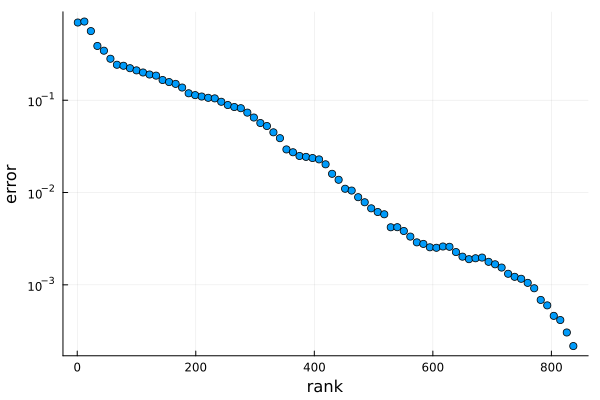

In [100]:
err = [] 
kk = 1:(Int(floor(n/100))):min(m,n)
for k ∈ kk
    if (k <= kmax)
        A′ = P[:,1:k] * diagm( σ[1:k] ) * Q[:,1:k]'
        push!( err, norm(A - A′,Inf) )
    else
        kk = filter(t->t<=kmax,kk)
        break;
    end
end
scatter( kk, err, yaxis=:log, xlabel="rank", ylabel="error", legend=false )

The exact same analysis extends to each of the RGB channels:

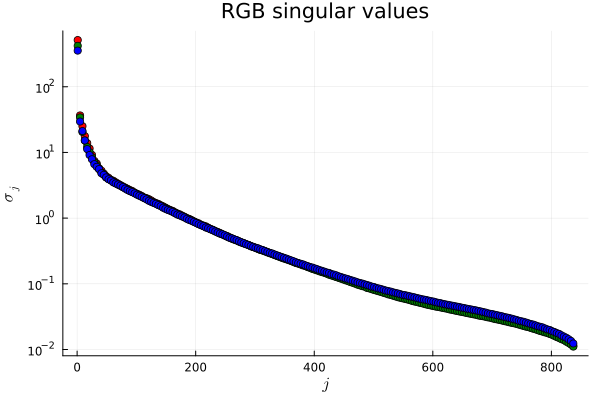

In [101]:
x = 1:(Int(floor(n/250))):min(m,n)
PR, σR, QR = svd(R)
PG, σG, QG = svd(G)
PB, σB, QB = svd(B)
scatter(x, σR[x], xaxis=(L"j"), yaxis=:log, ylabel=L"\sigma_j", title="RGB singular values", color="red", legend=false)
scatter!(x, σG[x], xaxis=(L"j"), color="green")
scatter!(x, σB[x], xaxis=(L"j"), color="blue")

We can then create the image $A_k$ from the low rank approximations $R_{k_1}, G_{k_2}, B_{k_3}$ coresponding to the RGB channels where $k = k_1 + k_2 + k_3$:

┌ Info: Saved animation to c:\Users\math5\Math 5485\Math5485\Pictures\Monty.gif
└ @ Plots C:\Users\math5\.julia\packages\Plots\xKhUG\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\math5\\Math 5485\\Math5485\\Pictures\\Monty.gif")
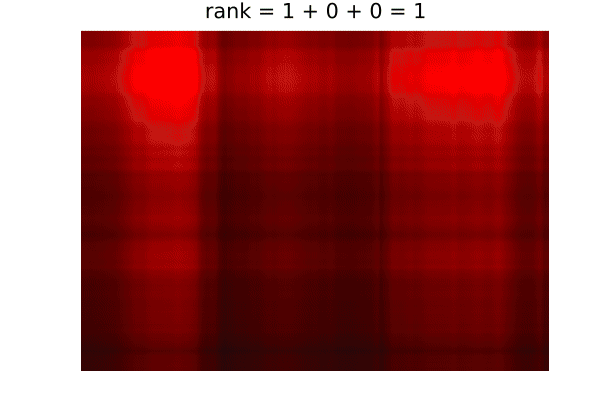

In [102]:
# | echo: false

plt = plot( frame=:none ) 

Rmax = length(σR)
Gmax = length(σG)
Bmax = length(σB)
rmax = Rmax + Gmax + Bmax;
σ = [σR; σG; σB]

if (i==15)
    rr = 1:100
elseif ((i==3) || (i==17))
    rr = 1:20
elseif (i==18)
    rr = [1,2,3,4,5,6,7,8,9,10,15,20,30,50,75,100,150,200]
else
    rr = [1,2,3,4,5,10,20,30,40,50,100,200,300,400]
end

anim = @animate for r ∈ rr
    if (r<=rmax)
        idxs = partialsortperm(σ, 1:r, rev=true)
        rR = min( Rmax, count( t->t<=Rmax, idxs ) )
        rG = min( Gmax, count( t->Rmax<t<=Rmax+Gmax, idxs ))
        rB = min( Bmax, r - rR - rG )

        if (rR == 0)
            R′ = zeros(m,n)
        else
            R′ = PR[:,1:rR] * diagm( σR[1:rR] ) * QR[:,1:rR]'
        end

        if (rG == 0)
            G′ = zeros(m,n)
        else
            G′ = PG[:,1:rG] * diagm( σG[1:rG] ) * QG[:,1:rG]'
        end

        if (rB == 0)
            B′ = zeros(m,n)
        else
            B′ = PB[:,1:rB] * diagm( σB[1:rB] ) * QB[:,1:rB]'
        end

        plot( plt, RGB.(R′, G′, B′), title="rank = $rR + $rG + $rB = $r") # (out of $rmax)" ) 
    end
end
gif(anim, "Pictures/Monty.gif", fps = 2) 



Again, we can compute the savings made in storage requirements:

In [103]:
r = 200;
println( "pixels = $m x $n x RGB = ", m*n*3 ) 
println( "PCA amount of data (with r = $r) = ", r*(m+n+1) )
println( "ratio = " , (r*(m+n+1))/(3*m*n))

pixels = 839 x 1152 x RGB = 2899584
PCA amount of data (with r = 200) = 398400
ratio = 0.13739901999735135


## Exercise 1 (Chessboard)

<div style='background-color: #cce0ff; padding: 10px; border-left: 5px solid #0066ff;'><strong>Example (Chessboard).</strong> 

1. What do the RGB channels look like?
2. What is the rank of the chessboard matrix?
3. How many non-zero singular values are there?
4. What are the corresponding singular vectors?

Hint: You may simplify the problem and consider the matrix 

\begin{align}
    \begin{pmatrix}
        0 & 1 & 0 & 1 & 0 & 1 & 0 & 1 \\
        1 & 0 & 1 & 0 & 1 & 0 & 1 & 0\\
        0 & 1 & 0 & 1 & 0 & 1 & 0 & 1 \\
        1 & 0 & 1 & 0 & 1 & 0 & 1 & 0\\
        0 & 1 & 0 & 1 & 0 & 1 & 0 & 1 \\
        1 & 0 & 1 & 0 & 1 & 0 & 1 & 0\\
        0 & 1 & 0 & 1 & 0 & 1 & 0 & 1 \\
        1 & 0 & 1 & 0 & 1 & 0 & 1 & 0
    \end{pmatrix}
\end{align}

</div> 

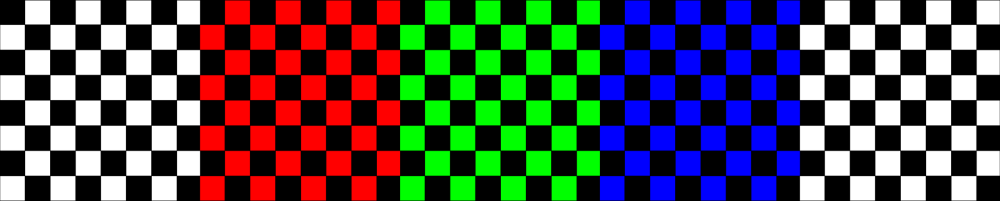

In [118]:
I = img[4]
m, n = size( I )

z = zeros(m,n);
R, G, B, A = Float64.(red.(I)), Float64.(green.(I)), Float64.(blue.(I)), Float64.(Gray.(I));

[ RGB.(R, G, B) RGB.(R, z, z) RGB.(z, G, z) RGB.(z, z, B) Gray.(I) ]

(number singular values ≥ 1e-10) = 2


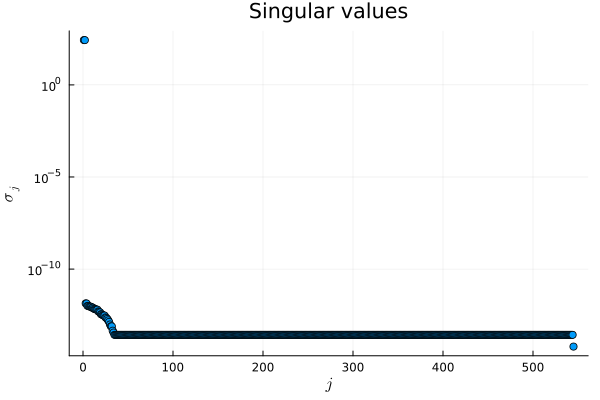

In [119]:
P, σ, Q = svd(A)
println( "(number singular values ≥ 1e-10) = ", count(t->t>=1e-10, σ) )
scatter(σ, xaxis=(L"j"), yaxis=:log, ylabel=L"\sigma_j", title="Singular values", legend=false)

The singular vectors are as follows:

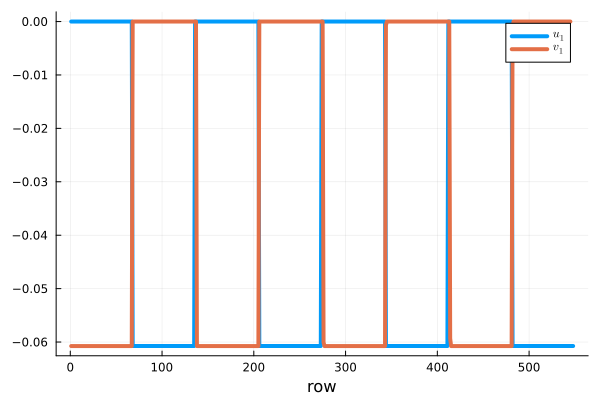

In [120]:
plot( P[:,1], xlabel="row", label=L"u_1", lw=4 )
plot!( Q[:,1], label=L"v_1", lw=4 )
# plot( P[:,2], label=L"u_2", lw=4 )
# plot!( Q[:,2], label=L"v_2", lw=4 )

┌ Info: Saved animation to C:\Users\math5\AppData\Local\Temp\jl_Pmx690zqXa.gif
└ @ Plots C:\Users\math5\.julia\packages\Plots\xKhUG\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\math5\\AppData\\Local\\Temp\\jl_Pmx690zqXa.gif")
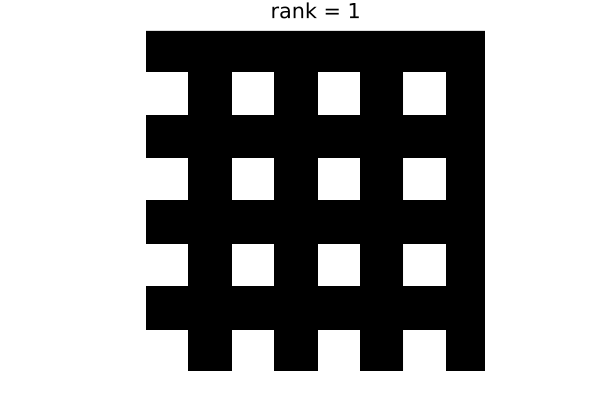

In [122]:
plt = plot( frame=:none ) 
anim = @animate for k ∈ 1:5
    plot( plt, Gray.( P[:,1:k] * diagm( σ[1:k] ) * Q[:,1:k]' ), title="rank = $k")#  (out of $rmax)" ) 
end
gif(anim, fps = 1) 

## Exercise 2

Consider the following images:

,

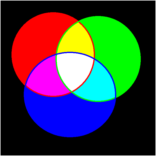
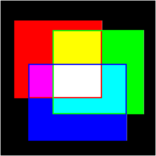

In [108]:
[img[15], img[16]]

1. What do the RGB channels look like?
2. How quickly do you expect the singular values to decay?
3. Which image can we use a lower rank approximation? 

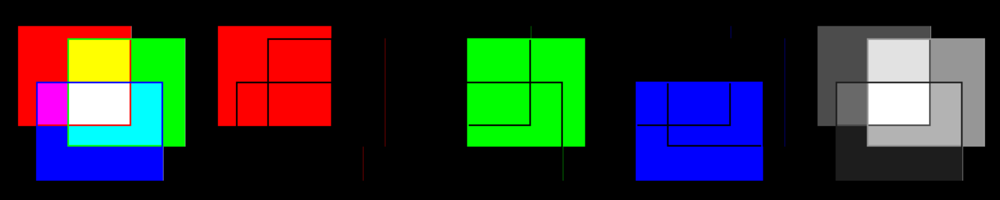

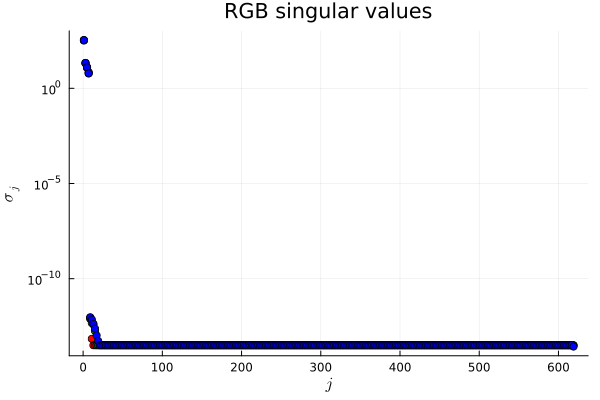

620 x 620 image = 384400 pixels


┌ Info: Saved animation to c:\Users\math5\Math 5485\Math5485\Pictures\5485.gif
└ @ Plots C:\Users\math5\.julia\packages\Plots\xKhUG\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\math5\\Math 5485\\Math5485\\Pictures\\5485.gif")
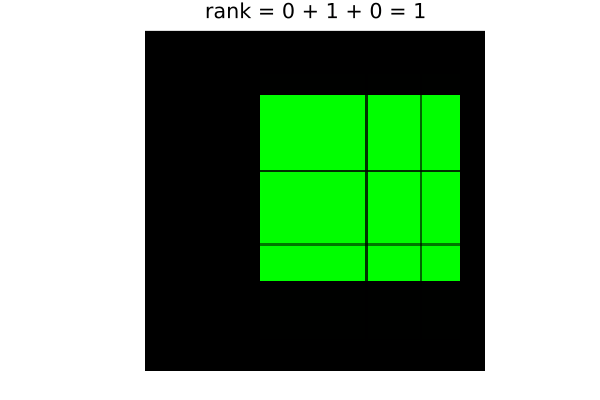

In [112]:
# | echo: false

# pick image
I = img[16]
m, n = size( I )

# display channels
z = zeros(m,n);
R, G, B, A = Float64.(red.(I)), Float64.(green.(I)), Float64.(blue.(I)), Float64.(Gray.(I));
display( [ RGB.(R, G, B) RGB.(R, z, z) RGB.(z, G, z) RGB.(z, z, B) Gray.(I) ] )

# SVD
x = 1:(Int(floor(n/250))):min(m,n)
PR, σR, QR = svd(R)
PG, σG, QG = svd(G)
PB, σB, QB = svd(B)
plt1 = scatter(x, σR[x], xaxis=(L"j"), yaxis=:log, ylabel=L"\sigma_j", title="RGB singular values", color="red", legend=false)
scatter!(plt1, x, σG[x], xaxis=(L"j"), color="green")
scatter!(plt1, x, σB[x], xaxis=(L"j"), color="blue")
display( plt1 )

# gif
plt2 = plot( frame=:none ) 
Rmax, Gmax, Bmax = length(σR), length(σG), length(σB)
kmax = Rmax + Gmax + Bmax;
σ = [σR; σG; σB]

anim = @animate for k ∈ [1,2,3,4,5,10,20,30,40,50,100,200,300,400]
    if (k<=kmax)
        idxs = partialsortperm(σ, 1:k, rev=true)
        kR = min( Rmax, count( t->t<=Rmax, idxs ) )
        kG = min( Gmax, count( t->Rmax<t<=Rmax+Gmax, idxs ))
        kB = min( Bmax, k - kR - kG )

        if (kR == 0)
            R′ = zeros(m,n)
        else
            R′ = PR[:,1:kR] * diagm( σR[1:kR] ) * QR[:,1:kR]'
        end

        if (kG == 0)
            G′ = zeros(m,n)
        else
            G′ = PG[:,1:kG] * diagm( σG[1:kG] ) * QG[:,1:kG]'
        end

        if (kB == 0)
            B′ = zeros(m,n)
        else
            B′ = PB[:,1:kB] * diagm( σB[1:kB] ) * QB[:,1:kB]'
        end

        plot( plt2, RGB.(R′, G′, B′), title="rank = $kR + $kG + $kB = $k") # (out of $rmax)" ) 
    end
end

println( "$m x $n image = ", m*n, " pixels" )

gif(anim, "Pictures/5485.gif", fps = 2) 

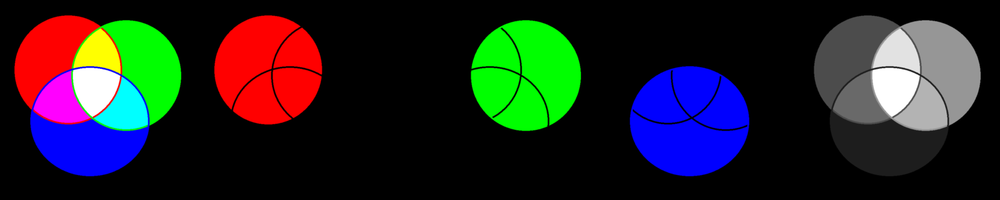

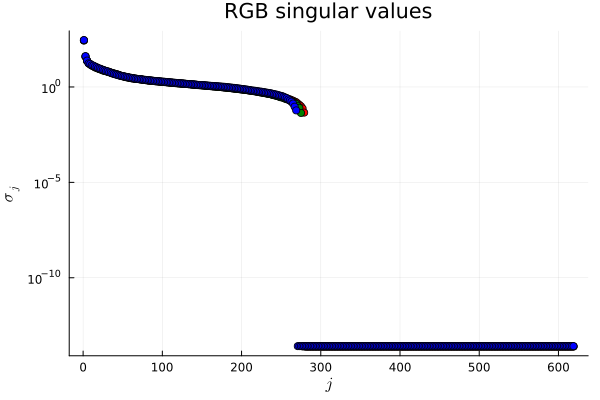

620 x 620 image = 384400 pixels
620 x 620 image = 384400 pixels


┌ Info: Saved animation to C:\Users\math5\AppData\Local\Temp\jl_TcFyB0R43y.gif
└ @ Plots C:\Users\math5\.julia\packages\Plots\xKhUG\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\math5\\AppData\\Local\\Temp\\jl_TcFyB0R43y.gif")
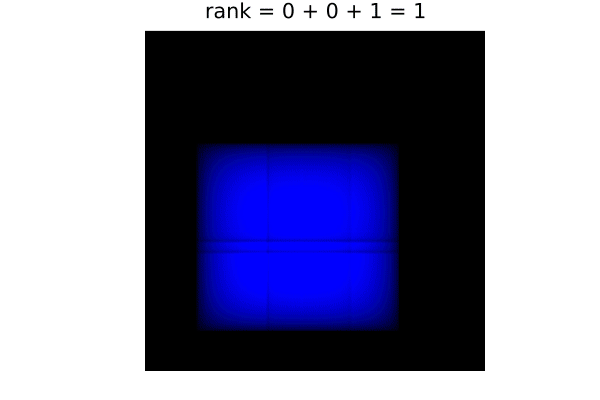

In [110]:
# | echo: false

# pick image
I = img[15]
m, n = size( I )

# display channels
z = zeros(m,n);
R, G, B, A = Float64.(red.(I)), Float64.(green.(I)), Float64.(blue.(I)), Float64.(Gray.(I));
display( [ RGB.(R, G, B) RGB.(R, z, z) RGB.(z, G, z) RGB.(z, z, B) Gray.(I) ] )

# SVD
x = 1:(Int(floor(n/250))):min(m,n)
PR, σR, QR = svd(R)
PG, σG, QG = svd(G)
PB, σB, QB = svd(B)
plt1 = scatter(x, σR[x], xaxis=(L"j"), yaxis=:log, ylabel=L"\sigma_j", title="RGB singular values", color="red", legend=false)
scatter!(plt1, x, σG[x], xaxis=(L"j"), color="green")
scatter!(plt1, x, σB[x], xaxis=(L"j"), color="blue")
display( plt1 )

# gif
plt2 = plot( frame=:none ) 
Rmax, Gmax, Bmax = length(σR), length(σG), length(σB)
kmax = Rmax + Gmax + Bmax;
σ = [σR; σG; σB]

anim = @animate for k ∈ [1,2,3,4,5,10,20,30,40,50,100,200,300,400]
    if (k<=kmax)
        idxs = partialsortperm(σ, 1:k, rev=true)
        kR = min( Rmax, count( t->t<=Rmax, idxs ) )
        kG = min( Gmax, count( t->Rmax<t<=Rmax+Gmax, idxs ))
        kB = min( Bmax, k - kR - kG )

        if (kR == 0)
            R′ = zeros(m,n)
        else
            R′ = PR[:,1:kR] * diagm( σR[1:kR] ) * QR[:,1:kR]'
        end

        if (kG == 0)
            G′ = zeros(m,n)
        else
            G′ = PG[:,1:kG] * diagm( σG[1:kG] ) * QG[:,1:kG]'
        end

        if (kB == 0)
            B′ = zeros(m,n)
        else
            B′ = PB[:,1:kB] * diagm( σB[1:kB] ) * QB[:,1:kB]'
        end

        plot( plt2, RGB.(R′, G′, B′), title="rank = $kR + $kG + $kB = $k") # (out of $rmax)" ) 
    end
end

println( "$m x $n image = ", m*n, " pixels" )
println( "$m x $n image = ", m′*n′, " pixels" )


gif(anim, fps = 2) 

<div style='background-color: #cce0ff; padding: 10px; border-left: 5px solid #0066ff;'><strong>Exercise.</strong> 

Download this notebook and play around with your own images!

</div> 